In [ ]:
!pip install opencv-python
!pip install sk-video
!pip install transformers
!pip install --upgrade transformers
!pip install accelerate
!pip install mlxu
!pip install -U git+https://github.com/facebookresearch/chameleon.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 87.0 MB/s eta 0:00:00
  Attempting uninstall: transformers
    Found existing installation: transformers 4.47.1
    Uninstalling transformers-4.47.1:
      Successfully uninstalled transformers-4.47.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━

**STOP, -- PRESS RESTART -- If on Colab**

# Setup

In [ ]:
!git clone https://github.com/tera-ai/tardis.git

In [ ]:
%cd lvm_action

/content/lvm_action


In [ ]:
import gc
import pandas as pd
from tqdm.auto import tqdm

In [ ]:
import pickle
import json
import base64

from tqdm.notebook import tqdm, trange

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import einops

np.float = np.float64
np.int = np.int_

from PIL import Image

import cv2
import skvideo.io
import matplotlib.pyplot as plt

In [ ]:
import mlxu
from transformers import LlamaForCausalLM, SuppressTokensLogitsProcessor

In [ ]:
!gsutil -m cp gs://tera-tardis/STRIDE-1/checkpoint.msgpack .

Copying gs://tera-wm/experiments/run_12/c04bb4fe1c5541bcba42f346c0abab01/streaming_train_state_200000...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

| [1/1 files][  9.2 GiB/  9.2 GiB] 100% Done 150.7 MiB/s ETA 00:00:00           
Operation completed over 1 objects/9.2 GiB.                                      


In [ ]:
!python -m EasyLM.models.llama.convert_easylm_to_hf --load_checkpoint='trainstate_params::/content/tardis/checkpoint.msgpack' --model_size='vqlm_1b' --output_dir='.'

Loading the checkpoint in a Llama model.
Loading checkpoint shards: 100% 23/23 [00:05<00:00,  4.11it/s]
Saving in the Transformers format.


In [ ]:
model = LlamaForCausalLM.from_pretrained(
    '.',
    torch_dtype=torch.float16, device_map='cuda:0',
)

In [ ]:
from transformers import SuppressTokensLogitsProcessor
import torch
import einops
import numpy as np
import matplotlib.pyplot as plt

# Move model and net to CUDA
model.to('cuda:0')
#net.to('cuda')

# Device
device = model.device


import torch

class DeviceAwareSuppressTokensLogitsProcessor(SuppressTokensLogitsProcessor):
    def __init__(self, suppress_tokens_tensor: torch.Tensor):
        super().__init__(suppress_tokens_tensor.cpu().tolist())  # Initialize with a list
        self.suppress_tokens_tensor = suppress_tokens_tensor

    def __call__(self, input_ids: torch.LongTensor, scores: torch.FloatTensor) -> torch.FloatTensor:
        vocab_tensor = torch.arange(scores.shape[-1], device=scores.device)
        suppress_token_mask = torch.isin(vocab_tensor, self.suppress_tokens_tensor)
        scores = torch.where(suppress_token_mask, -float("inf"), scores)
        return scores


# Initialize suppress_tokens on the same device as the model
suppress_tokens = [2]
suppress_tokens_tensor = torch.tensor(suppress_tokens, device=device)
logits_processor = DeviceAwareSuppressTokensLogitsProcessor(suppress_tokens_tensor)

In [ ]:
!pip install gdown

In [ ]:
!gdown 1-A3efcs6qtUPQFBclIcuUYaoq2paQh1g
!gdown 1--qkhrGwMyIXLtycJeR_dycLnF3wdxnO
!gdown 1-E2jzqDGwSN1NsinrbJg-gCB6eH_8Sav

Downloading...
From: https://drive.google.com/uc?id=1-A3efcs6qtUPQFBclIcuUYaoq2paQh1g
To: /content/lvm_action/text_tokenizer.json
100% 5.63M/5.63M [00:00<00:00, 35.8MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1--qkhrGwMyIXLtycJeR_dycLnF3wdxnO
From (redirected): https://drive.google.com/uc?id=1--qkhrGwMyIXLtycJeR_dycLnF3wdxnO&confirm=t&uuid=566426a6-ce03-4c52-89c0-7e34f198d9cf
To: /content/lvm_action/vqgan.ckpt
100% 281M/281M [00:03<00:00, 71.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-E2jzqDGwSN1NsinrbJg-gCB6eH_8Sav
To: /content/lvm_action/vqgan.yaml
100% 1.49k/1.49k [00:00<00:00, 8.92MB/s]


In [ ]:
from chameleon.inference.chameleon import TokenManager

token_manager = TokenManager(
                 tokenizer_path="./text_tokenizer.json",
                 vqgan_cfg_path="./vqgan.yaml",
                 vqgan_ckpt_path="./vqgan.ckpt",
                 device="cpu")

VQModel loaded from ./vqgan.ckpt


In [ ]:
import pandas as pd
import folium
import numpy as np
from math import sin, cos, radians

def create_arrow_coordinates(lat, lon, heading_deg, length=0.001):
    """Create coordinates for an arrow to show heading direction."""
    # Convert heading to radians
    heading_rad = radians(heading_deg)

    # Calculate arrow endpoint
    dlat = length * cos(heading_rad)
    dlon = length * sin(heading_rad)

    # Return coordinates for arrow line
    return [(lat, lon), (lat + dlat, lon + dlon)]

def visualize_coordinates(df, output_file='comparison_map.html'):
    # Read the CSV file

    # Calculate center point for the map
    center_lat = df['GT Lat'].mean()
    center_lon = df['GT Lon'].mean()

    # Create base map
    m = folium.Map(location=[center_lat, center_lon], zoom_start=13)

    # Create feature groups for better organization
    gt_group = folium.FeatureGroup(name='Ground Truth')
    gen_group = folium.FeatureGroup(name='Generated')

    # Add markers and arrows for each point
    for idx, row in df.iterrows():
        # Ground truth coordinates (blue)
        gt_coords = (row['GT Lat'], row['GT Lon'])
        gt_arrow_coords = create_arrow_coordinates(row['GT Lat'], row['GT Lon'],
                                                 row['GT Spatial Action Heading (º)'])

        # Generated coordinates (red)
        gen_coords = (row['Gen Lat'], row['Gen Lon'])
        gen_arrow_coords = create_arrow_coordinates(row['Gen Lat'], row['Gen Lon'],
                                                  row['Gen Spatial Action Heading (º)'])

        # Add ground truth marker and arrow
        folium.CircleMarker(
            location=gt_coords,
            radius=5,
            color='blue',
            fill=True,
            popup=f"Line {row['Line']}, GT Point {idx}",
        ).add_to(gt_group)

        folium.PolyLine(
            locations=gt_arrow_coords,
            color='blue',
            weight=2,
            opacity=0.8
        ).add_to(gt_group)

        # Add generated marker and arrow
        folium.CircleMarker(
            location=gen_coords,
            radius=5,
            color='red',
            fill=True,
            popup=f"Line {row['Line']}, Generated Point {idx}",
        ).add_to(gen_group)

        folium.PolyLine(
            locations=gen_arrow_coords,
            color='red',
            weight=2,
            opacity=0.8
        ).add_to(gen_group)

        # Add line connecting ground truth to generated point
        folium.PolyLine(
            locations=[gt_coords, gen_coords],
            color='gray',
            weight=1,
            opacity=0.5,
            popup=f"Spatial Error: {row['Spatial Error (m)']:.2f}m"
        ).add_to(m)

    # Add feature groups to map
    gt_group.add_to(m)
    gen_group.add_to(m)

    # Add layer control
    folium.LayerControl().add_to(m)

    # Save the map
    m.save(output_file)

    # Print summary statistics
    print("\nSummary Statistics:")
    print(f"Total points: {len(df)}")
    print(f"Average spatial error: {df['Spatial Error (m)'].mean():.2f}m")
    print(f"Max spatial error: {df['Spatial Error (m)'].max():.2f}m")
    print(f"Average heading error: {df['Spatial Action Heading Error (º)'].mean():.2f}º")

    # Calculate statistics by line
    line_stats = df.groupby('Line').agg({
        'Spatial Error (m)': ['mean', 'max'],
        'Spatial Action Heading Error (º)': 'mean'
    }).round(2)

    print("\nStatistics by Line:")
    print(line_stats)
    return m

In [ ]:
class SpecialTokenGenerator:
    # Fixed reserved token markers
    BEGINNING_OF_SENTENCE = 0
    ENDING_OF_SENTENCE = 2

    # Hardcoded reserved token markers
    BEGINNING_OF_IMAGE = 8_197
    ENDING_OF_IMAGE = 8_196

    def __init__(
        self,
        min_latitude: float = 37.50555625328688,
        max_latitude: float = 37.57277786216565,
        latitude_precision: float = 0.00001,
        min_longitude: float = -122.3491638598312,
        max_longitude: float = -122.2491688227424,
        longitude_precision: float = 0.00001,
        min_month: int = 1,
        max_month: int = 12,
        month_precision: int = 1,
        min_year: int = 2000,
        max_year: int = 2030,
        year_precision: int = 1,
        min_move: float = 0.0,
        max_move: float = 50.0,
        move_precision: float = 0.1,
        min_heading: float = 0.0,
        max_heading: float = 360.0,
        heading_precision: float = 0.1,
        min_month_action: int = 0,
        max_month_action: int = 11,
        month_action_precision: int = 1,
        min_year_action: int = -30,
        max_year_action: int = 30,
        year_action_precision: int = 1,
    ) -> None:
        # 1. Latitude (after image)
        self.beginning_of_latitude_marker, self.ending_of_latitude_marker = self.compute_markers(
            self.BEGINNING_OF_IMAGE,
            min_latitude,
            max_latitude,
            latitude_precision,
        )

        # 2. Longitude
        self.beginning_of_longitude_marker, self.ending_of_longitude_marker = self.compute_markers(
            self.ending_of_latitude_marker,
            min_longitude,
            max_longitude,
            longitude_precision,
        )

        # 3. Month
        self.beginning_of_month_marker, self.ending_of_month_marker = self.compute_markers(
            self.ending_of_longitude_marker,
            min_month,
            max_month,
            month_precision,
        )

        # 4. Year
        self.beginning_of_year_marker, self.ending_of_year_marker = self.compute_markers(
            self.ending_of_month_marker,
            min_year,
            max_year,
            year_precision,
        )

        # 5. Move
        self.beginning_of_move_marker, self.ending_of_move_marker = self.compute_markers(
            self.ending_of_year_marker,
            min_move,
            max_move,
            move_precision,
        )

        # 6. Heading
        self.beginning_of_heading_marker, self.ending_of_heading_marker = self.compute_markers(
            self.ending_of_move_marker,
            min_heading,
            max_heading,
            heading_precision,
        )

        # 7. Month Action
        self.beginning_of_month_action_marker, self.ending_of_month_action_marker = self.compute_markers(
            self.ending_of_heading_marker,
            min_month_action,
            max_month_action,
            month_action_precision,
        )

        # 8. Year Action
        self.beginning_of_year_action_marker, self.ending_of_year_action_marker = self.compute_markers(
            self.ending_of_month_action_marker,
            min_year_action,
            max_year_action,
            year_action_precision,
        )

    def compute_markers(
        self,
        ending_of_prev_marker: int,
        min_value_of_marker: int,
        max_value_of_marker: int,
        precision_of_marker: int,
    ):
        beginning_of_marker = ending_of_prev_marker + 1
        range_span = max_value_of_marker - min_value_of_marker + precision_of_marker
        range_of_current_marker = int(range_span / precision_of_marker)
        ending_of_current_marker = beginning_of_marker + range_of_current_marker + 2
        return (
            beginning_of_marker,
            ending_of_current_marker,
        )

In [ ]:
import math

class NumericalTokenizer:
    # this tokenizer can support 8000 tokens, used for xyz and gripper
    def __init__(self, min_value=-4, max_value=4, precision=0.001, token_start=8199):
        self.min_value = min_value
        self.max_value = max_value
        self.precision = precision
        self.token_start = token_start

        self.range_span = max_value - min_value + precision

        self.token_range = int(self.range_span / precision)
        self.token_end = token_start + self.token_range - 1

    def tokenize(self, value):
        """
        Transforms a value in the range to a token starting from token_start.
        """
        if value < self.min_value or value > self.max_value:
            raise ValueError(f"Value {value} is out of the expected range [{self.min_value}, {self.max_value}].")

        # Map the value to a token starting from token_start
        value = round(value, len(str(self.precision).split('.')[-1]))
        token = int(((value - self.min_value) / self.range_span) * self.token_range) + self.token_start
        return token

    def detokenize(self, token, round_output=True):
        """
        Transforms a token starting from token_start back to a value in the range.
        """
        if token < self.token_start or token > self.token_start + self.token_range:
            raise ValueError(
                f"Token {token} is out of the expected range [{self.token_start}, {self.token_start + self.token_range}].")

        # Map the token back to the original value
        value = ((token - self.token_start) / self.token_range) * self.range_span + self.min_value

        if round_output and self.precision != 1:
          # Return the value rounded to the precision level
          return round(value, -math.floor(math.log10(abs(self.precision - round(self.precision)))))
        else:
          return value

In [ ]:
special_tokens = SpecialTokenGenerator()

In [ ]:
min_latitude: float = 37.50555625328688
max_latitude: float = 37.57277786216565
latitude_precision: float = 0.00001
min_longitude: float = -122.3491638598312
max_longitude: float = -122.2491688227424
longitude_precision: float = 0.00001
min_month: int = 1
max_month: int = 12
month_precision: int = 1
min_year: int = 2000
max_year: int = 2030
year_precision: int = 1
min_move: float = 0.0
max_move: float = 50.0
move_precision: float = 0.1
min_heading: float = 0.0
max_heading: float = 360.0
heading_precision: float = 0.1
min_month_action: int = 0
max_month_action: int = 11
month_action_precision: int = 1
min_year_action: int = -30
max_year_action: int = 30
year_action_precision: int = 1

In [ ]:
lat_tokenizer = NumericalTokenizer(min_value=min_latitude,
                                   max_value=max_latitude,
                                   precision=latitude_precision,
                                   token_start=special_tokens.beginning_of_latitude_marker+1)

lon_tokenizer = NumericalTokenizer(min_value=min_longitude,
                                   max_value=max_longitude,
                                   precision=longitude_precision,
                                   token_start=special_tokens.beginning_of_longitude_marker+1)

month_tokenizer = NumericalTokenizer(min_value=min_month, max_value=max_month,
                                     precision=month_precision,
                                     token_start=special_tokens.beginning_of_month_marker+1)

year_tokenizer = NumericalTokenizer(min_value=min_year, max_value=max_year,
                                    precision=year_precision,
                                    token_start=special_tokens.beginning_of_year_marker+1)

move_tokenizer = NumericalTokenizer(min_value=min_move, max_value=max_move,
                                    precision=move_precision,
                                    token_start=special_tokens.beginning_of_move_marker+1)

head_tokenizer = NumericalTokenizer(min_value=min_heading, max_value=max_heading,
                                    precision=heading_precision,
                                    token_start=special_tokens.beginning_of_heading_marker+1)

month_action_tokenizer = NumericalTokenizer(min_value=min_month_action, max_value=max_month_action,
                                            precision=month_action_precision,
                                            token_start=special_tokens.beginning_of_month_action_marker+1)

year_action_tokenizer = NumericalTokenizer(min_value=min_year_action, max_value=max_year_action,
                                           precision=year_action_precision,
                                           token_start=special_tokens.beginning_of_year_action_marker+1)

In [ ]:
# Define special tokens
SPECIAL_TOKENS = {
    'bos': special_tokens.BEGINNING_OF_SENTENCE, 'eos': special_tokens.ENDING_OF_SENTENCE,
    'boi': special_tokens.BEGINNING_OF_IMAGE, 'eoi': special_tokens.ENDING_OF_IMAGE,
    'bla': special_tokens.beginning_of_latitude_marker, 'ela': special_tokens.ending_of_latitude_marker,
    'blo': special_tokens.beginning_of_longitude_marker, 'elo': special_tokens.ending_of_longitude_marker,
    'bmo': special_tokens.beginning_of_month_marker, 'emo': special_tokens.ending_of_month_marker,
    'bye': special_tokens.beginning_of_year_marker, 'eye': special_tokens.ending_of_year_marker,
    'bmv': special_tokens.beginning_of_move_marker, 'emv': special_tokens.ending_of_move_marker,
    'bhe': special_tokens.beginning_of_heading_marker, 'ehe': special_tokens.ending_of_heading_marker,
    'bma': special_tokens.beginning_of_month_action_marker, 'ema': special_tokens.ending_of_month_action_marker,
    'bya': special_tokens.beginning_of_year_action_marker, 'eya': special_tokens.ending_of_year_action_marker,
    'pad': 1
}

SPECIAL_TOKENS_REVERSE = {v: k for k, v in SPECIAL_TOKENS.items()}

In [ ]:
def print_meta(meta):
  for t, token in enumerate(meta):
    if token in SPECIAL_TOKENS_REVERSE:
      special_token = SPECIAL_TOKENS_REVERSE[token]
      if special_token == 'bla':
          lat = lat_tokenizer.detokenize(int(meta[t+1]))
          print("latitude:", lat)
      if special_token == 'blo':
          lon = lon_tokenizer.detokenize(int(meta[t+1]))
          print("longitude:", lon)
      if special_token == 'bmo':
          month_token = int(meta[t+1])
          month = month_tokenizer.detokenize(month_token, round_output=False)
          print("month:", int(month))
      if special_token == 'bye':
          year = year_tokenizer.detokenize(int(meta[t+1]), round_output=False)
          print("year:", int(year))
      if special_token == 'bmv':
          move = move_tokenizer.detokenize(int(meta[t+1]))
          print("move:", move, "m")
      if special_token == 'bhe':
          heading = head_tokenizer.detokenize(int(meta[t+1]))
          print("heading:", heading, "º")
      if special_token == 'bma':
          month_action = month_action_tokenizer.detokenize(int(meta[t+1]))
          print("month action:", month_action)
      if special_token == 'bya':
          year_action = year_action_tokenizer.detokenize(int(meta[t+1]))
          print("year action:", year_action)

  return lat, lon, month, year, move, heading, month_action, year_action

In [ ]:
def split_at(line, special_token):
    # Initialize variables
    result = []
    current_sublist = []

    for num in line:
        if num == special_token:
            current_sublist.append(num)
            result.append(current_sublist)
            current_sublist = []
        else:
            # Add number to current sublist
            current_sublist.append(num)

    # Add the last sublist if it's not empty
    if current_sublist and (current_sublist != [2]):
        result.append(current_sublist)

    return result

In [ ]:
def generate_next_image(prompt, num_image_tokens=1024, do_sample=True,
                        temperature=1.0, top_p=1.0, top_k=50):
    # check and prepare prompt
    assert prompt[-1] == special_tokens.ending_of_year_action_marker
    prompt.append(special_tokens.BEGINNING_OF_IMAGE)

    # supress non-image tokens
    suppress_tokens = [0, 1, 2, 3]
    suppress_tokens.extend(range(8196, 29163))
    suppress_tokens_tensor = torch.tensor(suppress_tokens, device=device)
    logits_processor = DeviceAwareSuppressTokensLogitsProcessor(suppress_tokens_tensor)

    token_tensor = torch.tensor([prompt])
    stacked_tokens = einops.repeat(token_tensor, 'b s -> (r b) s', r=repeat).to(device)
    attention_mask = torch.ones(stacked_tokens.shape, device=device)

    # generate next image, default t, p = 1.0
    with torch.no_grad():
        new_tokens = model.generate(
            input_ids=stacked_tokens,
            attention_mask=attention_mask,
            max_new_tokens=num_image_tokens, # image tokens
            do_sample=do_sample,
            temperature=temperature,
            top_p=top_p,
            top_k=top_k,
            logits_processor=[logits_processor],
            pad_token_id=1 #model.config.pad_token_id
        )

    return (new_tokens[0][-1024:]).to('cpu')

In [ ]:
def get_spatial_mask(prompt, special_token, offset=50):
    # offset of 50 tokens represents ~55m spatial offset
    # latitude masking
    if special_token == 'bla':
        # get previous lat token in prompt (respect edges)
        prev_lat_token_idx = len(prompt) - 1 - prompt[::-1][1:].index(special_tokens.beginning_of_latitude_marker)
        prev_lat_token = prompt[prev_lat_token_idx]
        assert prev_lat_token > special_tokens.beginning_of_latitude_marker
        assert prev_lat_token < special_tokens.ending_of_latitude_marker

        # expand by 50 in each direction (respect edges)
        lower_bound = max(prev_lat_token - offset, special_tokens.beginning_of_latitude_marker+1)
        upper_bound = min(prev_lat_token + offset, special_tokens.ending_of_latitude_marker-1)

    elif special_token == 'blo':
        # get previous lon token in prompt (respect edges)
        prev_lon_token_idx = len(prompt) - 1 - prompt[::-1][1:].index(special_tokens.beginning_of_longitude_marker)
        prev_lon_token = prompt[prev_lon_token_idx]
        assert prev_lon_token > special_tokens.beginning_of_longitude_marker
        assert prev_lon_token < special_tokens.ending_of_longitude_marker

        # expand by 50 in each direction (respect edges)
        lower_bound = max(prev_lon_token - offset, special_tokens.beginning_of_longitude_marker+1)
        upper_bound = min(prev_lon_token + offset, special_tokens.ending_of_longitude_marker-1)

    else:
       raise ValueError(f"Attempted to clip non lat lon token {special_token}")

    suppress_tokens = list(range(0, lower_bound))
    suppress_tokens.extend(range(upper_bound, 29163))
    return suppress_tokens

In [ ]:
def generate_next_token(prompt, do_sample=True, spatial_mask=True,
                        temperature=1.0, top_p=1.0, top_k=50):
    start_token = prompt[-1]
    if start_token in SPECIAL_TOKENS_REVERSE:
      special_token = SPECIAL_TOKENS_REVERSE[start_token]
      if special_token == 'bla':
          end_token = special_tokens.ending_of_latitude_marker
      if special_token == 'blo':
          end_token = special_tokens.ending_of_longitude_marker
      if special_token == 'bmo':
          end_token = special_tokens.ending_of_month_marker
      if special_token == 'bye':
          end_token = special_tokens.ending_of_year_marker
      if special_token == 'bmv':
          end_token = special_tokens.ending_of_move_marker
      if special_token == 'bhe':
          end_token = special_tokens.ending_of_heading_marker
      if special_token == 'bma':
          end_token = special_tokens.ending_of_month_action_marker
      if special_token == 'bya':
          end_token = special_tokens.ending_of_year_action_marker
    else:
      raise ValueError(f"Token {start_token} is not a <b> special token.")

    # supress non-relevant tokens
    if (special_token == 'bla' or special_token == 'blo') and spatial_mask:
      suppress_tokens = get_spatial_mask(prompt, special_token)
    else:
      suppress_tokens = list(range(0, start_token+1))
      suppress_tokens.extend(range(end_token, 29163))

    suppress_tokens_tensor = torch.tensor(suppress_tokens, device=device)
    logits_processor = DeviceAwareSuppressTokensLogitsProcessor(suppress_tokens_tensor)

    token_tensor = torch.tensor([prompt])
    stacked_tokens = einops.repeat(token_tensor, 'b s -> (r b) s', r=repeat).to(device)
    attention_mask = torch.ones(stacked_tokens.shape, device=device)

    # generate next token, default t, p = 1.0
    with torch.no_grad():
        new_tokens = model.generate(
            input_ids=stacked_tokens,
            attention_mask=attention_mask,
            max_new_tokens=1, # single token
            do_sample=do_sample,
            temperature=temperature,
            top_p=top_p,
            top_k=top_k,
            logits_processor=[logits_processor],
            pad_token_id=1 #model.config.pad_token_id
        )

    # Get result and clear memory
    result = int(new_tokens[0][-1].cpu())
    del token_tensor, stacked_tokens, attention_mask, new_tokens, suppress_tokens_tensor
    clear_gpu_memory()

    return result

In [ ]:
def haversine_distance(start_lat: float, start_lon: float, end_lat: float, end_lon: float) -> float:
    # Convert latitude and longitude to radians
    start_lat, start_lon, end_lat, end_lon = map(
        math.radians,
        [
            start_lat,
            start_lon,
            end_lat,
            end_lon,
        ]
    )

    # Calculate differences
    dlat = end_lat - start_lat
    dlon = end_lon - start_lon

    # Haversine formula
    a = math.sin(dlat / 2) ** 2 + math.cos(start_lat) * math.cos(end_lat) * math.sin(dlon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))

    return c

In [ ]:
def clear_gpu_memory():
    """Helper function to clear GPU cache and garbage collect"""
    gc.collect()
    torch.cuda.empty_cache()
    if torch.cuda.is_available():
        torch.cuda.synchronize()

# Testing Dataset

In [ ]:
!gsutil -m cp gs://tera-tardis/STRIDE-1/testing.jsonl .

In [ ]:
import json
desired_lines = 2056
prompts = []
with open('testing.jsonl', 'r') as f:
    for line in f:
        current_list = json.loads(line.strip())
        prompts.append(current_list)
        if len(prompts) >= desired_lines:
            break

# Full Inference

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]


---- Prompt ----


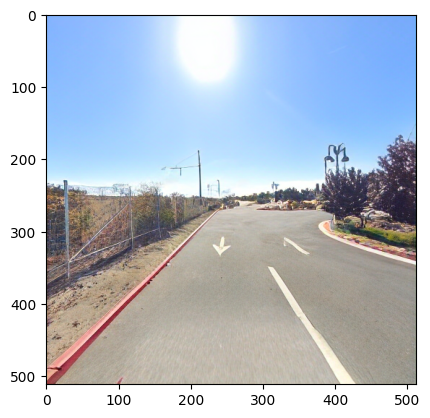

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0

---- Generation ----


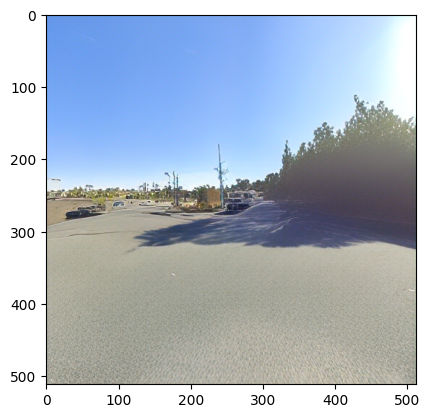

latitude: 37.50593
longitude: -122.25859
month: 2
year: 2017
move: 1.3
heading: 117.3
month action: 3.0
year action: -3.0

Spatial Error (m) 43.8
Temporal Error (months) 0
Temporal Error (years) 1

Measuring self-control error wont make much sense until instruction tuning...
Spatial Action Move Error (m) 0.9
Spatial Action Heading Error (º) 19.9
Temporal Action Error (months) 4
Temporal Action Error (years) 7

---- Prompt ----


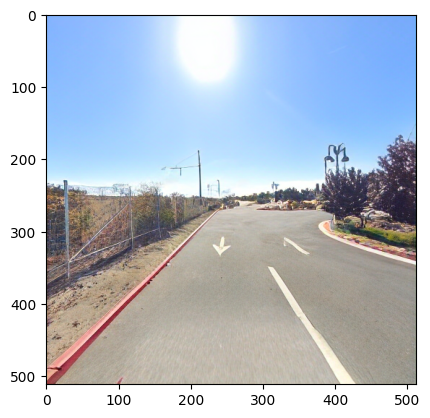

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0


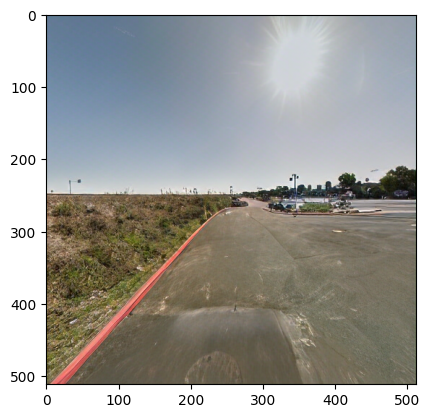

latitude: 37.50632
longitude: -122.25852
month: 2
year: 2018
move: 0.4 m
heading: 137.2 º
month action: 7.0
year action: 4.0

---- Generation ----


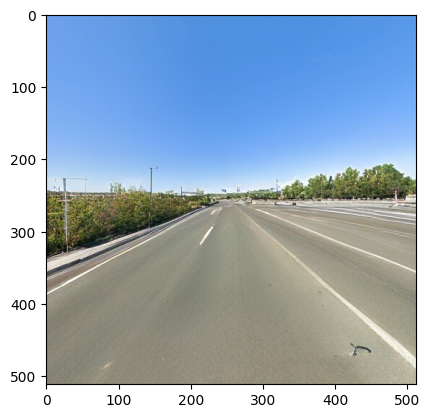

latitude: 37.50596
longitude: -122.25854
month: 9
year: 2022
move: 0.0
heading: 0.0
month action: 0.0
year action: 0.0

Spatial Error (m) 40.07
Temporal Error (months) 0
Temporal Error (years) 0

Measuring self-control error wont make much sense until instruction tuning...
Spatial Action Move Error (m) 11.1
Spatial Action Heading Error (º) 149.8
Temporal Action Error (months) 0
Temporal Action Error (years) 0

---- Prompt ----


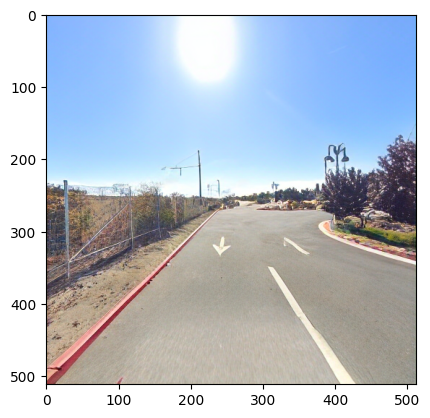

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0


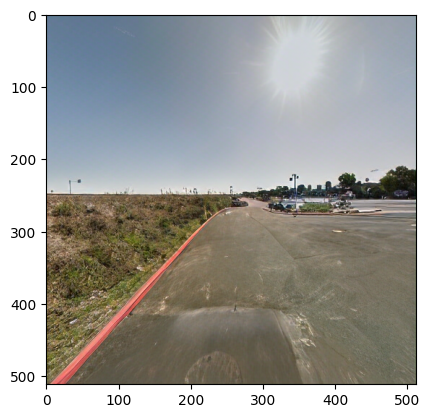

latitude: 37.50632
longitude: -122.25852
month: 2
year: 2018
move: 0.4 m
heading: 137.2 º
month action: 7.0
year action: 4.0


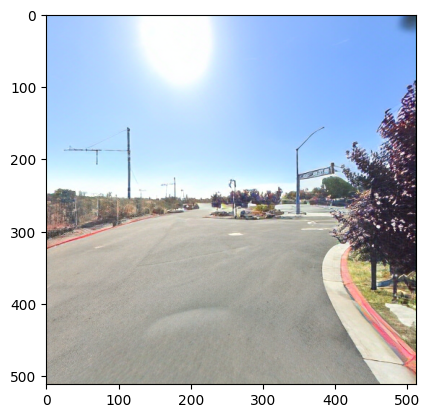

latitude: 37.50632
longitude: -122.25852
month: 9
year: 2022
move: 11.1 m
heading: 149.8 º
month action: 0.0
year action: 0.0

---- Generation ----


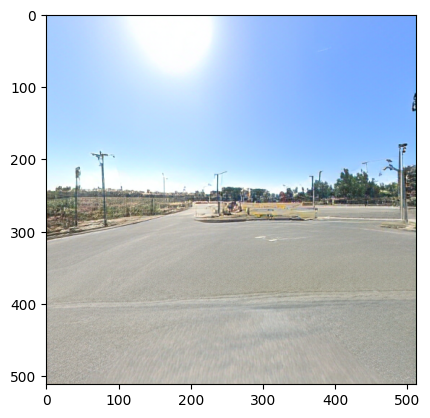

latitude: 37.50679
longitude: -122.25901
month: 6
year: 2022
move: 0.0
heading: 0.0
month action: 0.0
year action: 0.0

Spatial Error (m) 78.94
Temporal Error (months) 3
Temporal Error (years) 0

Measuring self-control error wont make much sense until instruction tuning...
Spatial Action Move Error (m) 23.6
Spatial Action Heading Error (º) 215.8
Temporal Action Error (months) 0
Temporal Action Error (years) 0

---- Prompt ----


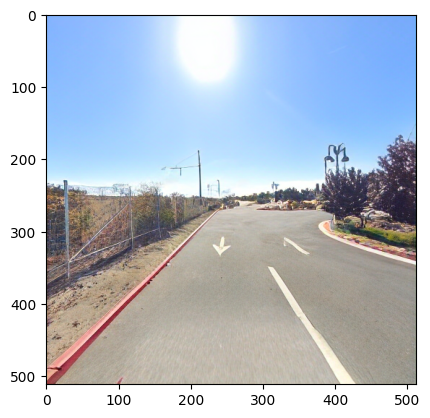

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0


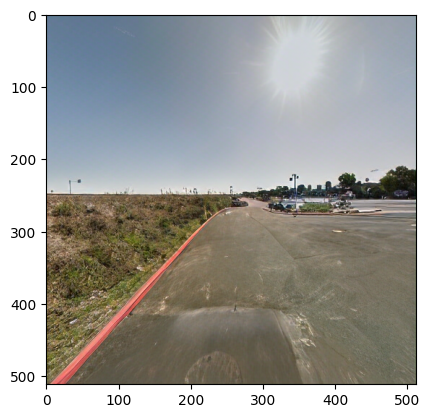

latitude: 37.50632
longitude: -122.25852
month: 2
year: 2018
move: 0.4 m
heading: 137.2 º
month action: 7.0
year action: 4.0


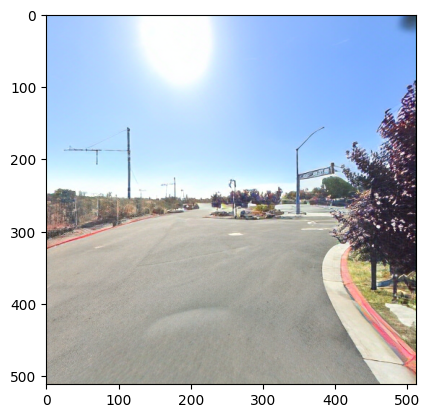

latitude: 37.50632
longitude: -122.25852
month: 9
year: 2022
move: 11.1 m
heading: 149.8 º
month action: 0.0
year action: 0.0


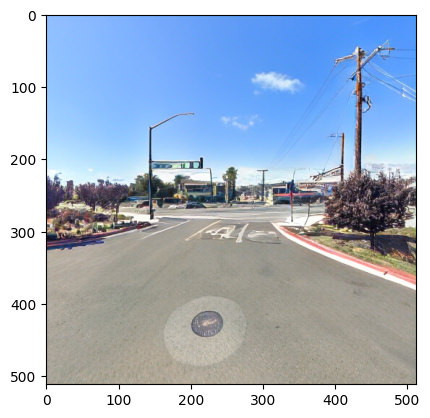

latitude: 37.50623
longitude: -122.25846
month: 9
year: 2022
move: 23.6 m
heading: 215.8 º
month action: 0.0
year action: 0.0

---- Generation ----


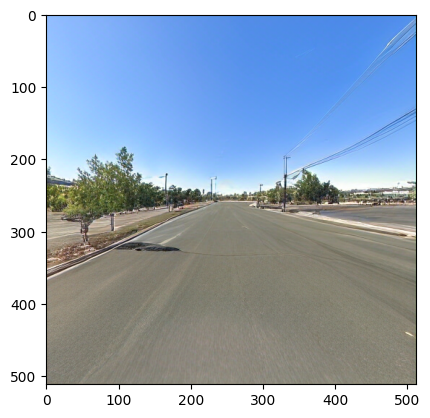

latitude: 37.50609
longitude: -122.25841
month: 6
year: 2022
move: 0.0
heading: 0.0
month action: 6.0
year action: -5.0

Spatial Error (m) 17.95
Temporal Error (months) 3
Temporal Error (years) 0

Measuring self-control error wont make much sense until instruction tuning...
Spatial Action Move Error (m) 8.1
Spatial Action Heading Error (º) 203.9
Temporal Action Error (months) 6
Temporal Action Error (years) 6

---- Prompt ----


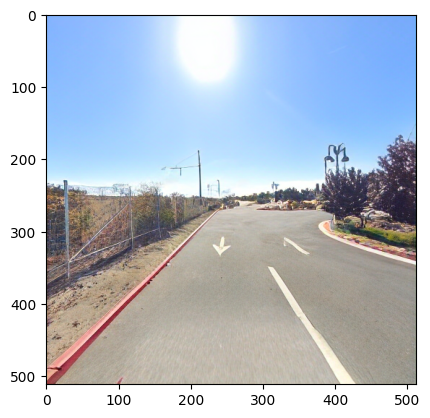

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0


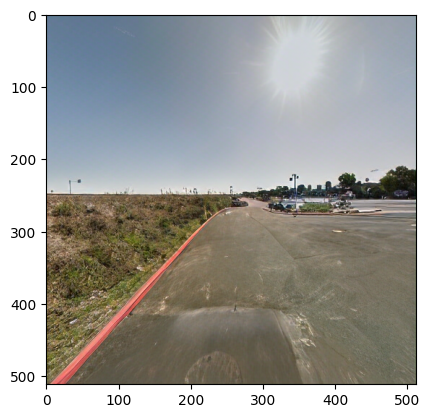

latitude: 37.50632
longitude: -122.25852
month: 2
year: 2018
move: 0.4 m
heading: 137.2 º
month action: 7.0
year action: 4.0


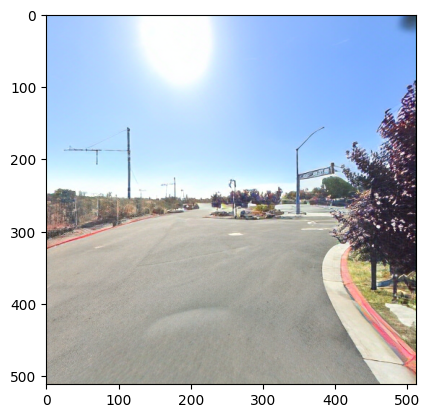

latitude: 37.50632
longitude: -122.25852
month: 9
year: 2022
move: 11.1 m
heading: 149.8 º
month action: 0.0
year action: 0.0


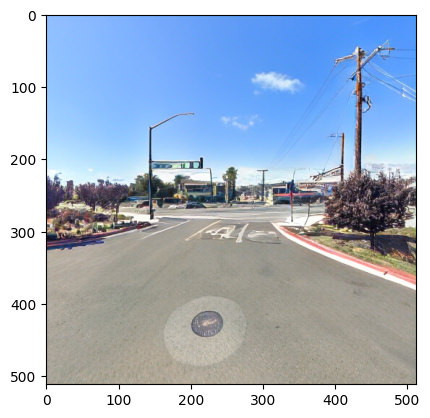

latitude: 37.50623
longitude: -122.25846
month: 9
year: 2022
move: 23.6 m
heading: 215.8 º
month action: 0.0
year action: 0.0


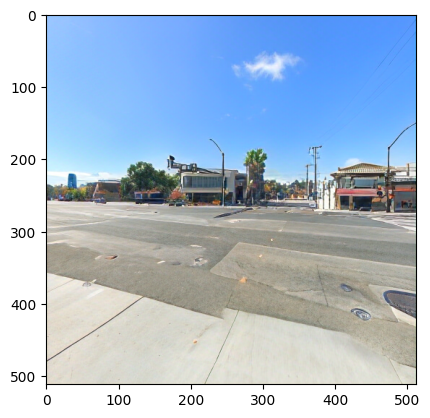

latitude: 37.50606
longitude: -122.25861
month: 9
year: 2022
move: 8.1 m
heading: 203.9 º
month action: 0.0
year action: 1.0

---- Generation ----


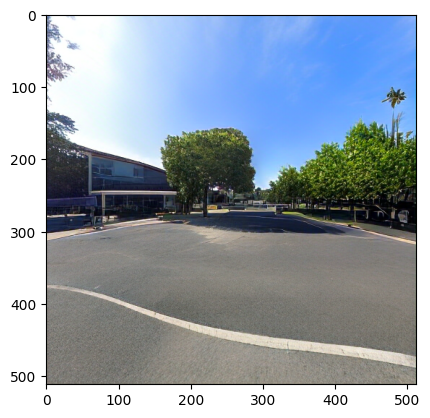

latitude: 37.50612
longitude: -122.259
month: 5
year: 2019
move: 0.5
heading: 225.8
month action: 0.0
year action: 0.0

Spatial Error (m) 34.09
Temporal Error (months) 4
Temporal Error (years) 4

Measuring self-control error wont make much sense until instruction tuning...
Spatial Action Move Error (m) 11.3
Spatial Action Heading Error (º) 89.5
Temporal Action Error (months) 0
Temporal Action Error (years) 0

---- Prompt ----


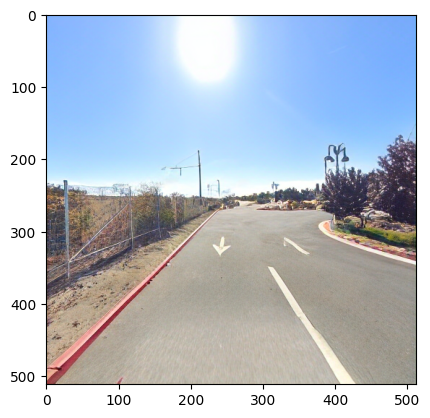

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0


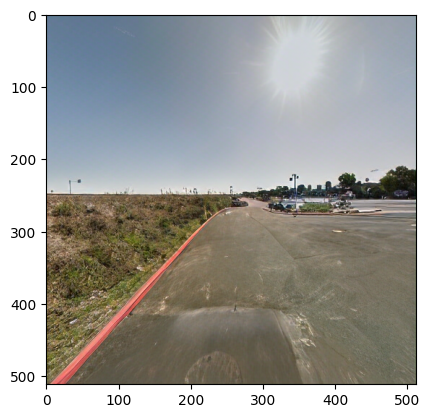

latitude: 37.50632
longitude: -122.25852
month: 2
year: 2018
move: 0.4 m
heading: 137.2 º
month action: 7.0
year action: 4.0


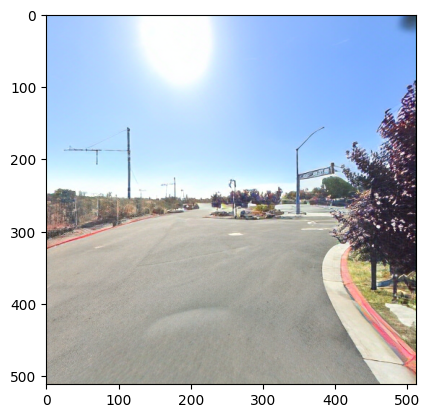

latitude: 37.50632
longitude: -122.25852
month: 9
year: 2022
move: 11.1 m
heading: 149.8 º
month action: 0.0
year action: 0.0


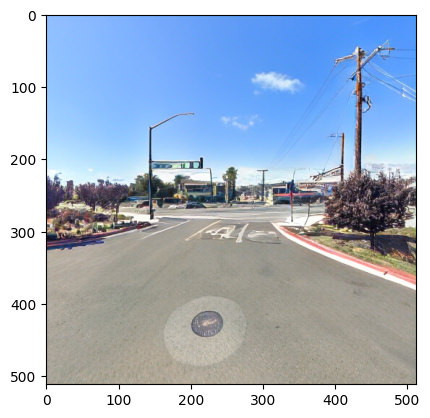

latitude: 37.50623
longitude: -122.25846
month: 9
year: 2022
move: 23.6 m
heading: 215.8 º
month action: 0.0
year action: 0.0


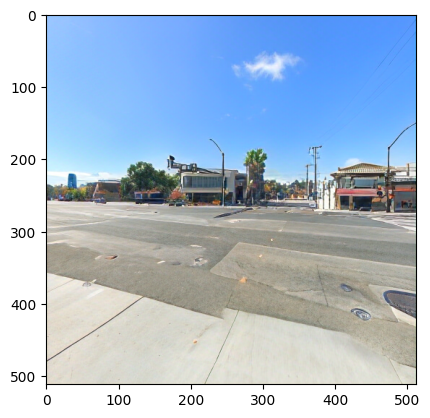

latitude: 37.50606
longitude: -122.25861
month: 9
year: 2022
move: 8.1 m
heading: 203.9 º
month action: 0.0
year action: 1.0


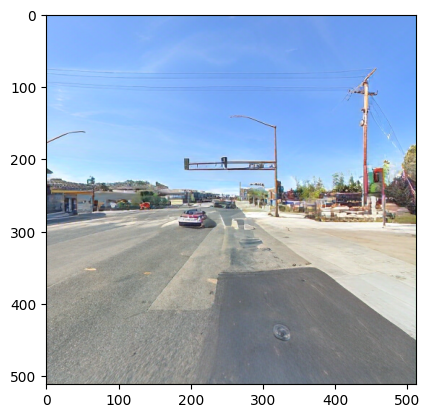

latitude: 37.50599
longitude: -122.25865
month: 9
year: 2023
move: 11.8 m
heading: 315.3 º
month action: 0.0
year action: 0.0

---- Generation ----


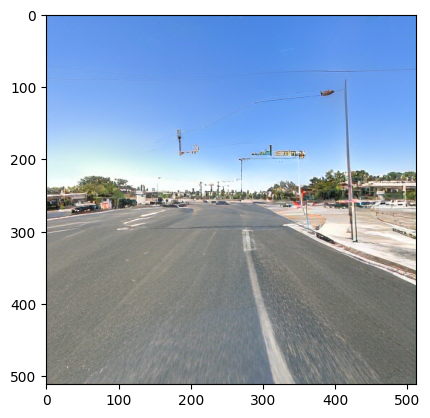

latitude: 37.50622
longitude: -122.25856
month: 9
year: 2022
move: 0.0
heading: 0.0
month action: 0.0
year action: 0.0

Spatial Error (m) 23.65
Temporal Error (months) 0
Temporal Error (years) 1

Measuring self-control error wont make much sense until instruction tuning...
Spatial Action Move Error (m) 12.5
Spatial Action Heading Error (º) 179.0
Temporal Action Error (months) 0
Temporal Action Error (years) 1

---- Prompt ----


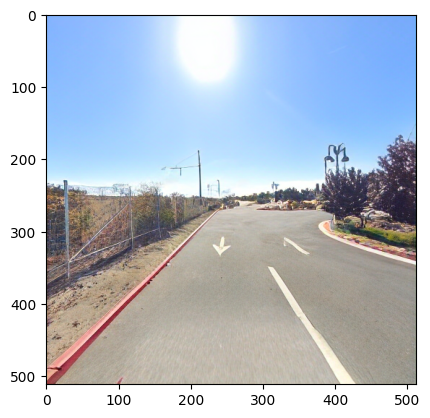

latitude: 37.50639
longitude: -122.2586
month: 9
year: 2022
move: 10.1 m
heading: 137.4 º
month action: 5.0
year action: -4.0


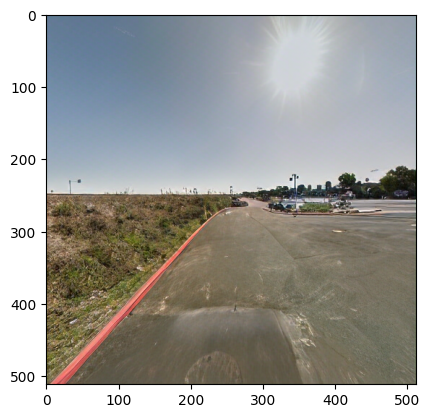

latitude: 37.50632
longitude: -122.25852
month: 2
year: 2018
move: 0.4 m
heading: 137.2 º
month action: 7.0
year action: 4.0


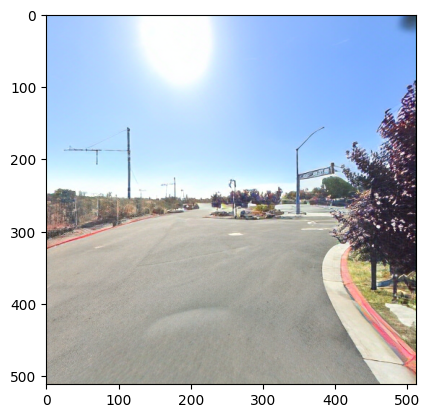

latitude: 37.50632
longitude: -122.25852
month: 9
year: 2022
move: 11.1 m
heading: 149.8 º
month action: 0.0
year action: 0.0


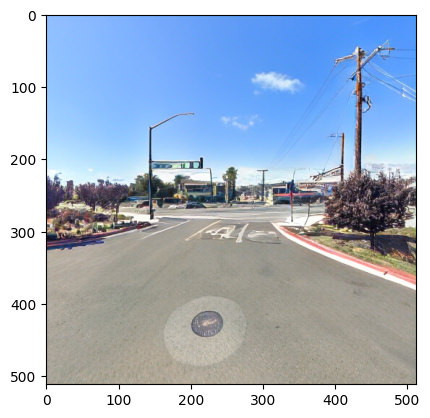

latitude: 37.50623
longitude: -122.25846
month: 9
year: 2022
move: 23.6 m
heading: 215.8 º
month action: 0.0
year action: 0.0


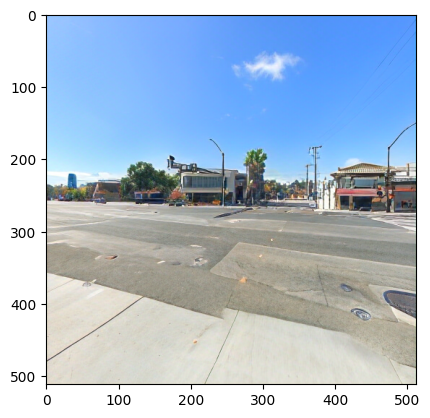

latitude: 37.50606
longitude: -122.25861
month: 9
year: 2022
move: 8.1 m
heading: 203.9 º
month action: 0.0
year action: 1.0


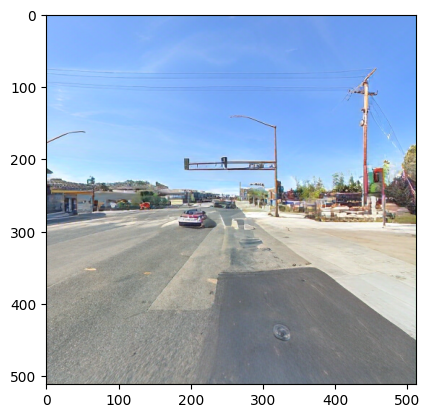

latitude: 37.50599
longitude: -122.25865
month: 9
year: 2023
move: 11.8 m
heading: 315.3 º
month action: 0.0
year action: 0.0


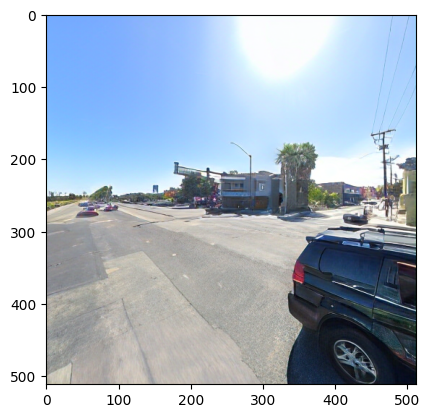

latitude: 37.50607
longitude: -122.25875
month: 9
year: 2023
move: 12.5 m
heading: 179.0 º
month action: 0.0
year action: -1.0

---- Generation ----


KeyboardInterrupt: 

In [ ]:
repeat = 1
RADIUS_OF_EARTH_IN_METERS = 6_371_000
result_dict = {"Line":[], "Prompt Nodes":[], "Generated Nodes":[],
               "GT Lat":[], "Gen Lat":[], "GT Lon":[], "Gen Lon":[],
               "Spatial Error (m)":[], "GT Month":[], "Gen Month":[],
               "Temporal Error (months)":[], "GT Year":[], "Gen Year":[],
               "Temporal Error (years)":[], "GT Spatial Action Move (m)":[],
               "Gen Spatial Action Move (m)":[], "Spatial Action Move Error (m)":[],
               "GT Spatial Action Heading (º)":[], "Gen Spatial Action Heading (º)":[],
               "Spatial Action Heading Error (º)":[], "GT Temporal Action Month":[],
               "Gen Temporal Action Month":[], "Temporal Action Error (months)":[],
               "GT Temporal Action Year":[], "Gen Temporal Action Year":[],
               "Temporal Action Error (years)":[]}

for l, line in tqdm(enumerate(prompts), total=len(prompts)):
    nodes = split_at(line, special_tokens.ending_of_year_action_marker)
    for i in tqdm(range(len(nodes)-1), total=len(nodes)-1):
        staircase_prompt = []
        j = 0
        print('\n---- Prompt ----')
        while j <= i:
          begining_of_image = nodes[j].index(special_tokens.BEGINNING_OF_IMAGE)
          image_tokens = split_at(nodes[j][begining_of_image:], special_tokens.ENDING_OF_IMAGE)[0]

          plt.imshow(token_manager.pil_from_bpe_tokens(torch.tensor(image_tokens[1:-1])))
          plt.show()

          meta_idx = nodes[j].index(special_tokens.beginning_of_latitude_marker)
          print_meta(nodes[j][meta_idx:])

          staircase_prompt.extend(nodes[j])
          manual_promt = staircase_prompt.copy()
          j += 1

        # get pred image
        print('\n---- Generation ----')
        gen_image = generate_next_image(staircase_prompt, do_sample=True) # def
        plt.imshow(token_manager.pil_from_bpe_tokens(gen_image))
        plt.show()

        # add gt image to prompt
        next_image_idx = nodes[i+1].index(special_tokens.BEGINNING_OF_IMAGE)
        next_gt_image_tokens = split_at(nodes[i+1][next_image_idx:],
                                        special_tokens.beginning_of_latitude_marker)[0]
        staircase_prompt.extend(next_gt_image_tokens)

        # get pred lat
        gen_lat = generate_next_token(staircase_prompt, do_sample=True)

        # get gt lat
        gt_lat_idx = nodes[i+1].index(special_tokens.beginning_of_latitude_marker)
        gt_lat = nodes[i+1][gt_lat_idx+1]

        # add pred lat to prompt
        pred_prompt = staircase_prompt.copy()
        pred_prompt.append(gen_lat)
        pred_prompt.append(special_tokens.ending_of_latitude_marker)
        pred_prompt.append(special_tokens.beginning_of_longitude_marker)

        # get pred lon
        gen_lon = generate_next_token(pred_prompt, do_sample=True)

        # get gt lon
        gt_lon_idx = nodes[i+1].index(special_tokens.beginning_of_longitude_marker)
        gt_lon = nodes[i+1][gt_lon_idx+1]

        error_m = RADIUS_OF_EARTH_IN_METERS * haversine_distance(
                    lat_tokenizer.detokenize(gt_lat),
                    lon_tokenizer.detokenize(gt_lon),
                    lat_tokenizer.detokenize(gen_lat),
                    lon_tokenizer.detokenize(gen_lon),
                )

        # add gt coords to prompt
        staircase_prompt.append(gt_lat)
        staircase_prompt.append(special_tokens.ending_of_latitude_marker)
        staircase_prompt.append(special_tokens.beginning_of_longitude_marker)
        staircase_prompt.append(gt_lon)
        staircase_prompt.append(special_tokens.ending_of_longitude_marker)
        staircase_prompt.append(special_tokens.beginning_of_month_marker)

        # predict month
        gen_month = generate_next_token(staircase_prompt, do_sample=False) # deterministic

        # get gt month
        gt_month_idx = nodes[i+1].index(special_tokens.beginning_of_month_marker)
        gt_month = nodes[i+1][gt_month_idx+1]

        # add pred month to prompt
        pred_prompt = staircase_prompt.copy()
        pred_prompt.append(gen_month)
        pred_prompt.append(special_tokens.ending_of_month_marker)
        pred_prompt.append(special_tokens.beginning_of_year_marker)

        # get pred year
        gen_year = generate_next_token(pred_prompt, do_sample=False) # det

        # get gt year
        gt_year_idx = nodes[i+1].index(special_tokens.beginning_of_year_marker)
        gt_year = nodes[i+1][gt_year_idx+1]

        difference_month = int(month_tokenizer.detokenize(gt_month, round_output=False) - month_tokenizer.detokenize(gen_month, round_output=False))
        difference_year = int(year_tokenizer.detokenize(gt_year, round_output=False) - year_tokenizer.detokenize(gen_year, round_output=False))

        # add gt temporal to prompt
        staircase_prompt.append(gt_month)
        staircase_prompt.append(special_tokens.ending_of_month_marker)
        staircase_prompt.append(special_tokens.beginning_of_year_marker)
        staircase_prompt.append(gt_year)
        staircase_prompt.append(special_tokens.ending_of_year_marker)
        staircase_prompt.append(special_tokens.beginning_of_move_marker)

        # predict move
        gen_move = generate_next_token(staircase_prompt)

        # get gt move
        gt_move_idx = nodes[i+1].index(special_tokens.beginning_of_move_marker)
        gt_move = nodes[i+1][gt_move_idx+1]

        # add pred move to prompt
        pred_prompt = staircase_prompt.copy()
        pred_prompt.append(gen_move)
        pred_prompt.append(special_tokens.ending_of_move_marker)
        pred_prompt.append(special_tokens.beginning_of_heading_marker)

        # predict heading
        gen_heading = generate_next_token(pred_prompt)

        # get gt heading
        gt_heading_idx = nodes[i+1].index(special_tokens.beginning_of_heading_marker)
        gt_heading = nodes[i+1][gt_heading_idx+1]

        # add gt spatial action to prompt
        staircase_prompt.append(gt_move)
        staircase_prompt.append(special_tokens.ending_of_move_marker)
        staircase_prompt.append(special_tokens.beginning_of_heading_marker)
        staircase_prompt.append(gt_heading)
        staircase_prompt.append(special_tokens.ending_of_heading_marker)
        staircase_prompt.append(special_tokens.beginning_of_month_action_marker)

        # pred month action
        gen_month_action = generate_next_token(staircase_prompt)

        # get gt month action
        gt_month_action_idx = nodes[i+1].index(special_tokens.beginning_of_month_action_marker)
        gt_month_action = nodes[i+1][gt_month_action_idx+1]

        # add pred month action to prompt
        pred_prompt = staircase_prompt.copy()
        pred_prompt.append(gen_month_action)
        pred_prompt.append(special_tokens.ending_of_month_action_marker)
        pred_prompt.append(special_tokens.beginning_of_year_action_marker)

        # pred year action
        gen_year_action = generate_next_token(pred_prompt)

        # get gt year action
        gt_year_action_idx = nodes[i+1].index(special_tokens.beginning_of_year_action_marker)
        gt_year_action = nodes[i+1][gt_year_action_idx+1]

        move_error = abs(move_tokenizer.detokenize(gt_move) - move_tokenizer.detokenize(gen_move))
        heading_error = abs(head_tokenizer.detokenize(gt_heading) - head_tokenizer.detokenize(gen_heading))
        month_action_error = abs(month_action_tokenizer.detokenize(gt_month_action) - month_action_tokenizer.detokenize(gen_month_action))
        year_action_error = abs(year_action_tokenizer.detokenize(gt_year_action) - year_action_tokenizer.detokenize(gen_year_action))

        result_dict["Line"].append(l)
        result_dict["Prompt Nodes"].append(j)
        result_dict["Generated Nodes"].append(1)
        result_dict["GT Lat"].append(lat_tokenizer.detokenize(gt_lat))
        result_dict["Gen Lat"].append(lat_tokenizer.detokenize(gen_lat))
        result_dict["GT Lon"].append(lon_tokenizer.detokenize(gt_lon))
        result_dict["Gen Lon"].append(lon_tokenizer.detokenize(gen_lon))
        result_dict["Spatial Error (m)"].append(error_m)
        result_dict["GT Month"].append(int(month_tokenizer.detokenize(gt_month, round_output=False)))
        result_dict["Gen Month"].append(int(month_tokenizer.detokenize(gen_month, round_output=False)))
        result_dict["Temporal Error (months)"].append(difference_month)
        result_dict["GT Year"].append(int(year_tokenizer.detokenize(gt_year, round_output=False)))
        result_dict["Gen Year"].append(int(year_tokenizer.detokenize(gen_year, round_output=False)))
        result_dict["Temporal Error (years)"].append(difference_year)
        result_dict["GT Spatial Action Move (m)"].append(move_tokenizer.detokenize(gt_move))
        result_dict["Gen Spatial Action Move (m)"].append(move_tokenizer.detokenize(gen_move))
        result_dict["Spatial Action Move Error (m)"].append(move_error)
        result_dict["GT Spatial Action Heading (º)"].append(head_tokenizer.detokenize(gt_heading))
        result_dict["Gen Spatial Action Heading (º)"].append(head_tokenizer.detokenize(gen_heading))
        result_dict["Spatial Action Heading Error (º)"].append(heading_error)
        result_dict["GT Temporal Action Month"].append(int(month_action_tokenizer.detokenize(gt_month_action)))
        result_dict["Gen Temporal Action Month"].append(int(month_action_tokenizer.detokenize(gen_month_action)))
        result_dict["Temporal Action Error (months)"].append(int(month_action_error))
        result_dict["GT Temporal Action Year"].append(int(year_action_tokenizer.detokenize(gt_year_action)))
        result_dict["Gen Temporal Action Year"].append(int(year_action_tokenizer.detokenize(gen_year_action)))
        result_dict["Temporal Action Error (years)"].append(int(year_action_error))

        print('latitude:', lat_tokenizer.detokenize(gen_lat))
        print('longitude:', lon_tokenizer.detokenize(gen_lon))
        print('month:', int(month_tokenizer.detokenize(gen_month, round_output=False)))
        print('year:', int(year_tokenizer.detokenize(gen_year, round_output=False)))
        print('move:', move_tokenizer.detokenize(gen_move))
        print('heading:', head_tokenizer.detokenize(gen_heading))
        print('month action:', month_action_tokenizer.detokenize(gen_month_action))
        print('year action:', year_action_tokenizer.detokenize(gen_year_action))
        print()
        print('Spatial Error (m)', round(error_m, 2))
        print('Temporal Error (months)', difference_month)
        print('Temporal Error (years)', difference_year)
        print()
        print('Measuring self-control error wont make much sense until instruction tuning...')
        print('Spatial Action Move Error (m)', move_error)
        print('Spatial Action Heading Error (º)', round(heading_error, 2))
        print('Temporal Action Error (months)', int(month_action_error))
        print('Temporal Action Error (years)', int(year_action_error))

        # Clear memory
        clear_gpu_memory()

# pd.DataFrame(result_dict).to_csv("c04bb4fe1c5541bcba42f346c0abab01_100k.csv", index=False)
#!gsutil cp /content/lvm_action/c04bb4fe1c5541bcba42f346c0abab01_80k.csv gs://tera-wm/eval/c04bb4fe1c5541bcba42f346c0abab01_80k.csv

# Manual Prompting

In [ ]:
month_dict = {
    1: "January",
    2: "February",
    3: "March",
    4: "April",
    5: "May",
    6: "June",
    7: "July",
    8: "August",
    9: "September",
    10: "October",
    11: "November",
    12: "December"
}

In [ ]:
repeat = 1
RADIUS_OF_EARTH_IN_METERS = 6_371_000
result_dict = {"Line":[], "Prompt Nodes":[], "Generated Nodes":[],
               "GT Lat":[], "Gen Lat":[], "GT Lon":[], "Gen Lon":[],
               "Spatial Error (m)":[], "GT Month":[], "Gen Month":[],
               "Temporal Error (months)":[], "GT Year":[], "Gen Year":[],
               "Temporal Error (years)":[], "GT Spatial Action Move (m)":[],
               "Gen Spatial Action Move (m)":[], "Spatial Action Move Error (m)":[],
               "GT Spatial Action Heading (º)":[], "Gen Spatial Action Heading (º)":[],
               "Spatial Action Heading Error (º)":[], "GT Temporal Action Month":[],
               "Gen Temporal Action Month":[], "Temporal Action Error (months)":[],
               "GT Temporal Action Year":[], "Gen Temporal Action Year":[],
               "Temporal Action Error (years)":[]}

for l, line in tqdm(enumerate(prompts[1:]), total=len(prompts[1:])):
    nodes = split_at(line, special_tokens.ending_of_year_action_marker)
    for i in tqdm(range(len(nodes)-1), total=len(nodes)-1):
        staircase_prompt = []
        j = 0
        print('\n---- Prompt ----')
        while j < i:
        #   begining_of_image = nodes[j].index(special_tokens.BEGINNING_OF_IMAGE)
        #   image_tokens = split_at(nodes[j][begining_of_image:], special_tokens.ENDING_OF_IMAGE)[0]

        #   plt.imshow(token_manager.pil_from_bpe_tokens(torch.tensor(image_tokens[1:-1])))
        #   plt.show()

        #   meta_idx = nodes[j].index(special_tokens.beginning_of_latitude_marker)
        #   _ = print_meta(nodes[j][meta_idx:])
          staircase_prompt.extend(nodes[j])

          j += 1

        # grabbing next node, add image
        begining_of_image = nodes[i].index(special_tokens.BEGINNING_OF_IMAGE)
        image_tokens = split_at(nodes[i][begining_of_image:], special_tokens.ENDING_OF_IMAGE)[0]
        plt.imshow(token_manager.pil_from_bpe_tokens(torch.tensor(image_tokens[1:-1])))
        plt.show()

        print('\n---- Original Prompt ----')
        meta_idx = nodes[i].index(special_tokens.beginning_of_latitude_marker)
        lat, lon, month, year, move, heading, month_action, year_action = print_meta(nodes[i][meta_idx:])

        print('\n---- Injecting Manual Prompt ----')
        # add everything up to some controllabe section, lets start with time
        manual_prompt = staircase_prompt.copy() # does not include current node

        # Add GT next everything up to bom to prompt
        up_to_move_idx = nodes[i].index(special_tokens.beginning_of_move_marker)
        manual_prompt.extend(nodes[i][:up_to_move_idx+1]) # +1 includes the bom itself
        assert manual_prompt[-1] == special_tokens.beginning_of_move_marker

        print('Changing Seasons...')
        print('New move = 0.0m')
        manual_move_token = move_tokenizer.tokenize(0.0)
        manual_prompt.append(manual_move_token)
        manual_prompt.append(special_tokens.ending_of_move_marker)

        manual_prompt.append(special_tokens.beginning_of_heading_marker)
        old_heading_idx = nodes[i].index(special_tokens.beginning_of_heading_marker)
        old_heading_token = nodes[i][old_heading_idx+1]
        manual_prompt.append(old_heading_token)
        manual_prompt.append(special_tokens.ending_of_heading_marker)
        print(f'New heading (same direction as before) {head_tokenizer.detokenize(old_heading_token)}')

        # fancy month math (add 6 lol)
        manual_prompt.append(special_tokens.beginning_of_month_action_marker)
        manual_prompt.append(month_action_tokenizer.tokenize(6))
        manual_prompt.append(special_tokens.ending_of_month_action_marker)

        print(f'Original month {month_dict[int(month)]}, injected month action {month_dict[int((month+6)%12)]}')

        # static
        print(f'Year actions set to zero')
        manual_prompt.append(special_tokens.beginning_of_year_action_marker)
        manual_prompt.append(year_action_tokenizer.tokenize(0))
        manual_prompt.append(special_tokens.ending_of_year_action_marker)

        # get pred image
        print('\n---- Generation ----')
        gen_image = generate_next_image(manual_prompt, do_sample=True) # CHANGE T, K, P?
        plt.imshow(token_manager.pil_from_bpe_tokens(gen_image))
        plt.show()

        # Clear memory
        clear_gpu_memory()